# Proyecto final de clustering

[Curso de Clustering con Python y scikit-learn](https://platzi.com/cursos/clustering)

## Importar librerías

In [231]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as  sns

## Carga de datos

In [232]:
df_customer = pd.read_csv('marketing_campaign.csv',sep='\t')
df_customer.sample(10)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
2022,4954,1956,Graduation,Married,48195.0,1,1,21-01-2014,53,106,...,6,0,0,0,0,0,0,3,11,0
1463,10403,1978,Graduation,Together,16531.0,1,0,18-06-2014,43,2,...,7,0,0,0,0,0,0,3,11,0
686,9826,1972,PhD,Single,86857.0,0,0,12-09-2012,96,899,...,2,0,0,0,0,0,0,3,11,1
2186,2666,1972,Master,Married,76234.0,0,1,06-02-2014,21,519,...,3,0,1,0,0,0,0,3,11,0
726,6086,1955,Graduation,Married,80395.0,0,0,23-11-2013,62,445,...,2,0,0,0,1,0,0,3,11,0
826,9499,1954,Graduation,Married,93404.0,1,2,07-05-2013,97,1279,...,5,0,1,1,0,0,0,3,11,0
241,9940,1958,Graduation,Together,64961.0,0,1,23-12-2012,97,382,...,3,0,0,0,0,0,0,3,11,0
622,10972,1949,Graduation,Widow,72298.0,0,0,10-03-2014,52,625,...,1,0,1,1,0,0,0,3,11,0
1626,8041,1971,PhD,Widow,47111.0,0,1,08-09-2012,35,595,...,9,0,0,0,0,0,0,3,11,0
2050,626,1951,Graduation,Married,32871.0,1,1,09-03-2013,28,22,...,4,0,0,0,0,0,0,3,11,0


In [3]:
df_customer.shape

(2240, 29)

In [4]:
df_customer.columns

Index(['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'AcceptedCmp1',
       'AcceptedCmp2', 'Complain', 'Z_CostContact', 'Z_Revenue', 'Response'],
      dtype='object')

# Variables del dataset 

## Datos del cliente
- **id**: Identificador único del cliente
- **Year_Birth**: Año de nacimiento del cliente.
- **Education**: Nivel educativo del cliente.
- **Kidhome**:  Número de niños en el hogar del cliente.
- **Teenhome**: Número de adolescentes en el hogar del cliente.
- **Dt_Customer**: Fecha en la que el cliente se enroló con la compañía.
- **Recency**: Número de días desde que se realizó la última compra del cliente.
- **Complain**: Qujea.1 Si el cliente se quejó en los últimos dos años y 0 si no se quejó.

## Productos
- **MntWines**: Cantidad gastada en vino en los últimos dos años.
- **MnFruits**: Cantidad gastada en fruta en los últimos dos años.
- **MntMeatProducts**: Cantidad gastada en carne en los últimos dos años.
- **MntFishProducts**: Cantidad gastada en pescado en los últimos dos años.
- **MntSweetProducts**: Cantidad gastada en dulces en los últimos dos años.
- **MntGoldProducts**: Cantidad gastada en oro en los últimos dos años.

## Promociones

- **NumDealsPurchases**: Número de compras realizadas con descuento.
- **AcceptedCmp1**: 1 si el cliente aceptó la oferta en la primera campaña,0 si no lo hizo.
- **AcceptedCmp2**: 1 si el cliente aceptó la oferta en la segunda campaña,0 si no lo hizo.
- **AcceptedCmp3**: 1 si el cliente aceptó la oferta en la tercera campaña,0 si no lo hizo.
- **AcceptedCmp4**: 1 si el cliente aceptó la oferta en la cuarta campaña,0 si no lo hizo.
- **AcceptedCmp5**: 1 si el cliente aceptó la oferta en la quinta campaña,0 si no lo hizo.
- **Response**: 1 si el cliente aceptó la oferta en la última campaña,0 si no lo hizo.
- **Z_CostContact**: No hay información de la variable.
- **Z_Revenue**: No hay información de la variable.

## Lugar de compra

- **NumWebPurchases**: Número de compras realizadas a través del sitio web de la compañía.
- **NumCatalogPurchases**: Número de compras realizadas mediante el catálogo.
- **NumStorePurchases**: Número de compras realizadas directamente en tiendas.
- **NumWebVisitsMonth**: Número de visitas realizadas en la pagina web en el último mes.




In [5]:
df_customer.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [6]:
df_customer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

## Manejando valores nulos

In [156]:
df_customer.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

# Eliminando valores nulos

In [233]:
df_customer.dropna(inplace=True)

In [234]:
df_customer.isnull().sum()


ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

In [161]:
df_customer.shape

(2216, 29)

## Validando duplicados

In [235]:
df_customer[df_customer.duplicated]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response


# Modificando la columna 'Dt_Customer" 

Para operar, se prefiere tener los días que hay entre la inscripción y la fecha actual. Así se aportaría más información.

In [236]:
import datetime

In [237]:
df_customer['Dt_Customer'] = pd.to_datetime(df_customer['Dt_Customer'],dayfirst=True)
today = pd.Timestamp.now()
df_customer['Dt_Customer'] = round((today-df_customer['Dt_Customer']).dt.days/365,1)
df_customer.rename(columns={'Dt_Customer':'Years_inscription'},inplace=True)

In [238]:
df_customer

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,11.0,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,9.5,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,10.0,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,9.6,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,9.6,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,10.2,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,1946,PhD,Together,64014.0,2,1,9.2,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,1981,Graduation,Divorced,56981.0,0,0,9.6,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,1956,Master,Together,69245.0,0,1,9.6,8,428,...,3,0,0,0,0,0,0,3,11,0


# Modificando el feature 'Year_Birth'

In [239]:
df_customer['Year_Birth'] = df_customer['Year_Birth'].apply(lambda x:2023-x)
df_customer.rename(columns={'Year_Birth':'Age'},inplace=True)

In [167]:
df_customer

,ID,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,66,Graduation,Single,58138.0,0,0,11.0,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,69,Graduation,Single,46344.0,1,1,9.5,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,58,Graduation,Together,71613.0,0,0,10.0,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,39,Graduation,Together,26646.0,1,0,9.6,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,42,PhD,Married,58293.0,1,0,9.6,94,173,...,5,0,0,0,0,0,0,3,11,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,56,Graduation,Married,61223.0,0,1,10.2,46,709,...,5,0,0,0,0,0,0,3,11,0
2236,4001,77,PhD,Together,64014.0,2,1,9.2,56,406,...,7,0,0,0,1,0,0,3,11,0
2237,7270,42,Graduation,Divorced,56981.0,0,0,9.6,91,908,...,6,0,1,0,0,0,0,3,11,0
2238,8235,67,Master,Together,69245.0,0,1,9.6,8,428,...,3,0,0,0,0,0,0,3,11,0


## Creación del feature campaign a partir de las columnas de campaign

In [240]:
df_customer['Campaign'] = (df_customer['AcceptedCmp1'] + df_customer['AcceptedCmp2']*2 + df_customer['AcceptedCmp3']*3+df_customer['AcceptedCmp4']*4+df_customer['AcceptedCmp5']*5+df_customer['Response'])

In [241]:
df_customer

,ID,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Campaign
0,5524,66,Graduation,Single,58138.0,0,0,11.0,58,635,...,0,0,0,0,0,0,3,11,1,1
1,2174,69,Graduation,Single,46344.0,1,1,9.5,38,11,...,0,0,0,0,0,0,3,11,0,0
2,4141,58,Graduation,Together,71613.0,0,0,10.0,26,426,...,0,0,0,0,0,0,3,11,0,0
3,6182,39,Graduation,Together,26646.0,1,0,9.6,26,11,...,0,0,0,0,0,0,3,11,0,0
4,5324,42,PhD,Married,58293.0,1,0,9.6,94,173,...,0,0,0,0,0,0,3,11,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,56,Graduation,Married,61223.0,0,1,10.2,46,709,...,0,0,0,0,0,0,3,11,0,0
2236,4001,77,PhD,Together,64014.0,2,1,9.2,56,406,...,0,0,0,1,0,0,3,11,0,1
2237,7270,42,Graduation,Divorced,56981.0,0,0,9.6,91,908,...,0,1,0,0,0,0,3,11,0,4
2238,8235,67,Master,Together,69245.0,0,1,9.6,8,428,...,0,0,0,0,0,0,3,11,0,0


# Eliminando features que no aportan información 

In [242]:
df_customer.drop(['ID','Z_Revenue','Z_CostContact','AcceptedCmp1','AcceptedCmp2','AcceptedCmp3','AcceptedCmp4','AcceptedCmp5','Response'],axis=1,inplace=True)

## Análisis exploratorio de datos

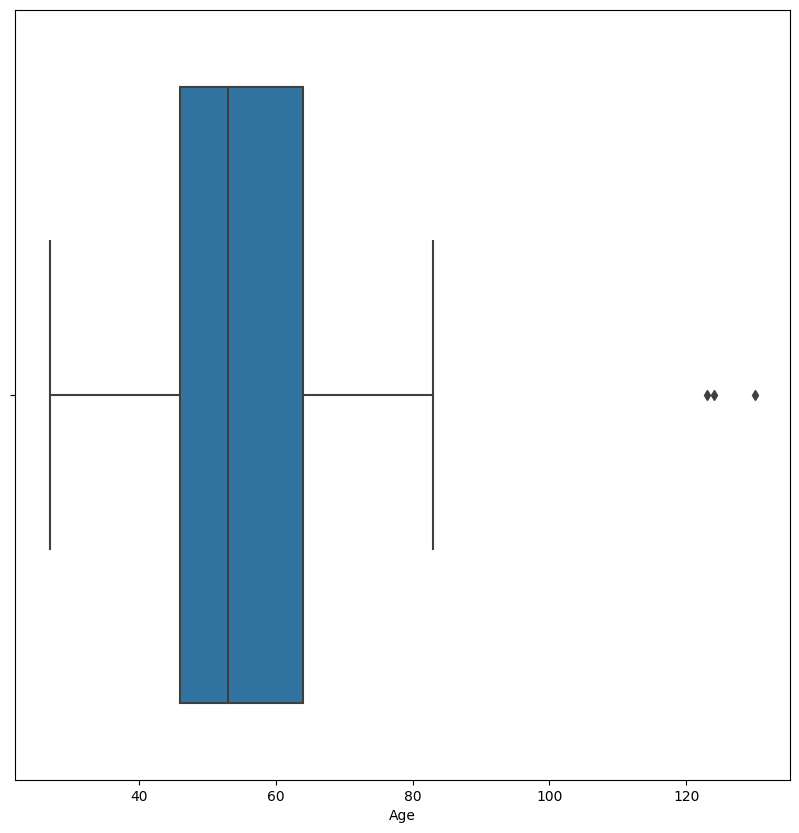

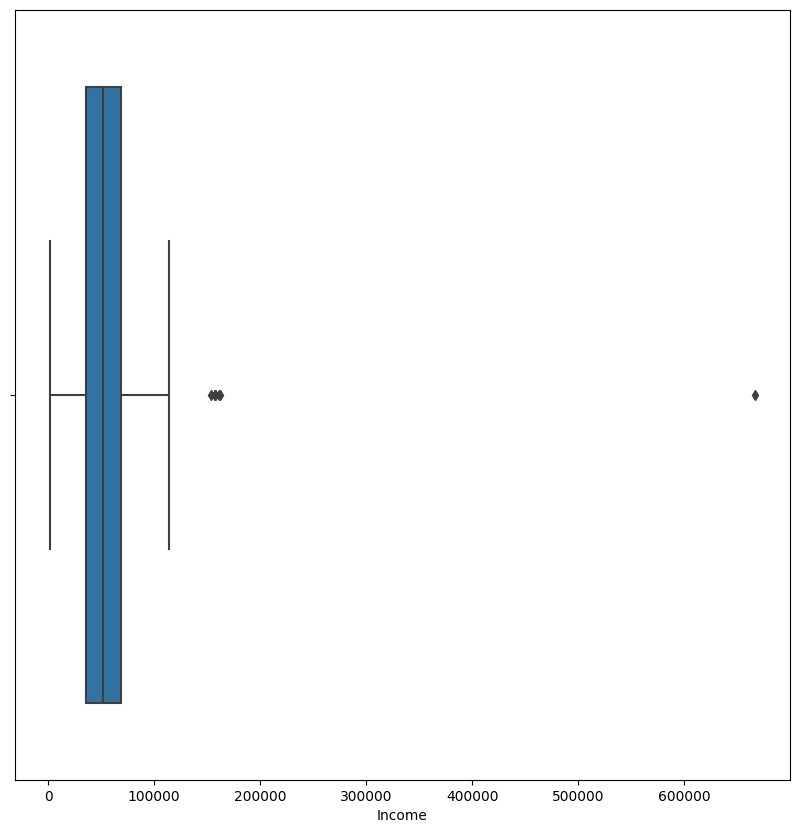

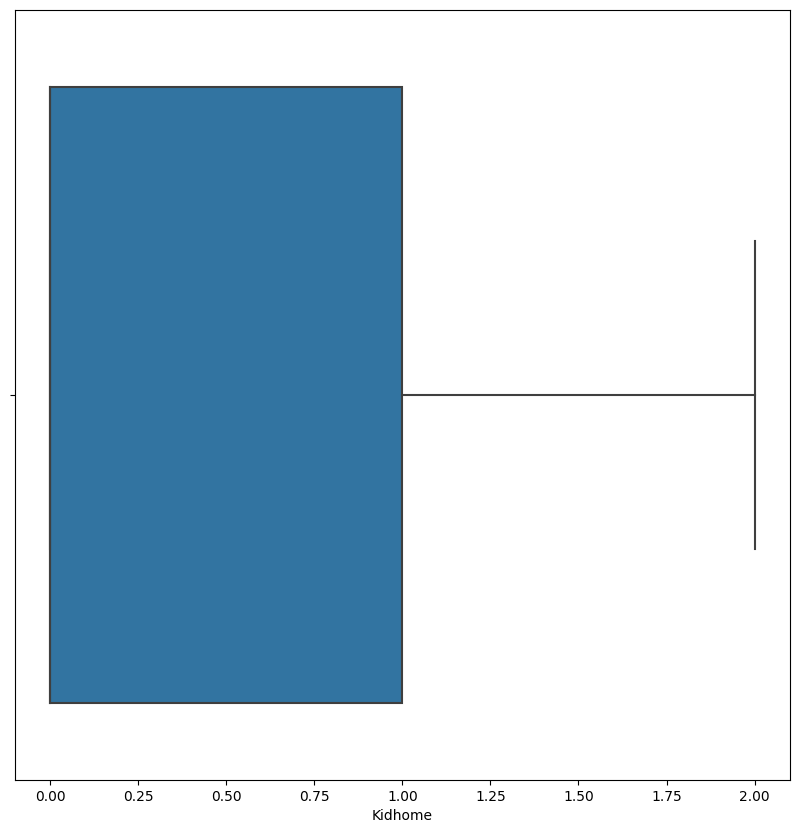

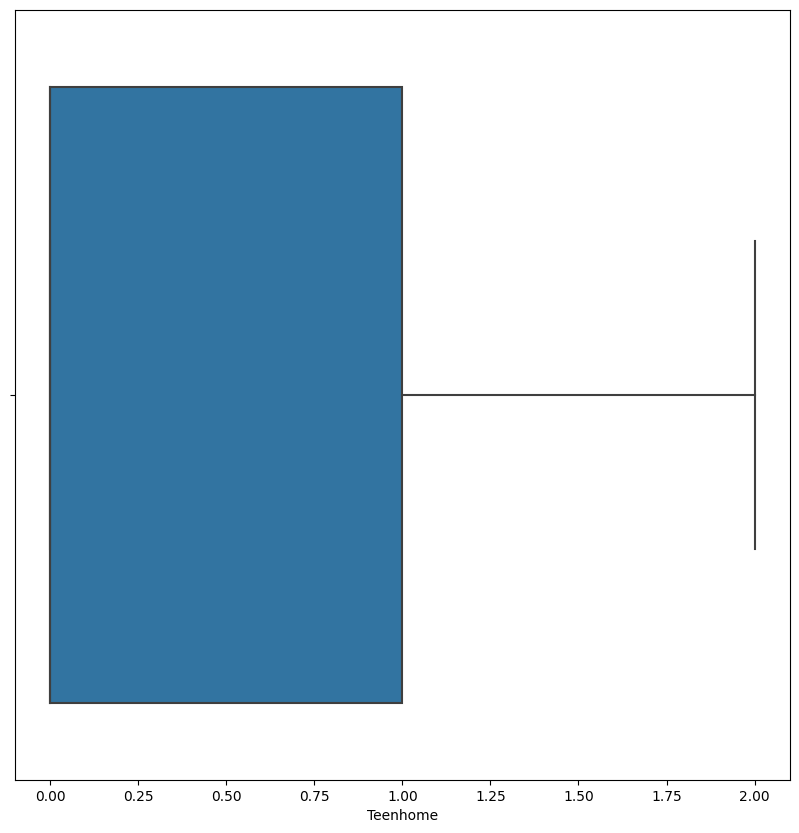

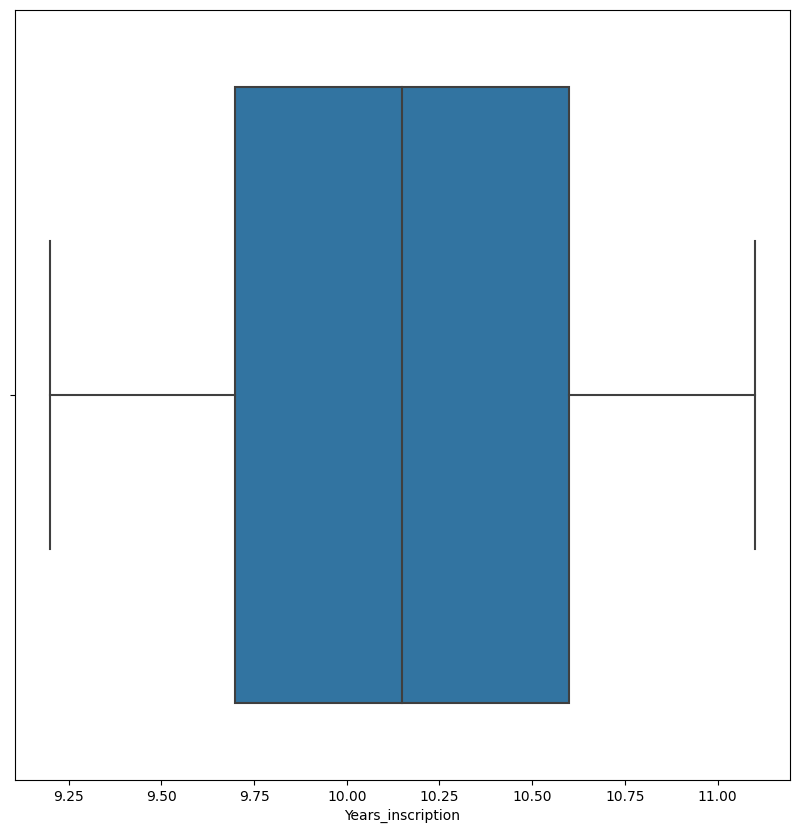

...

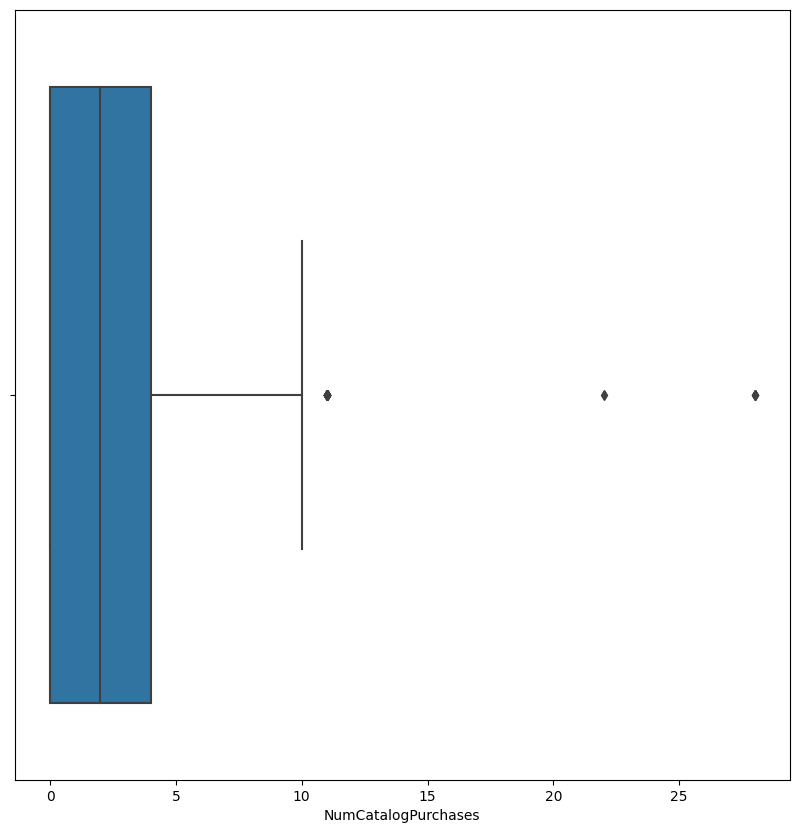

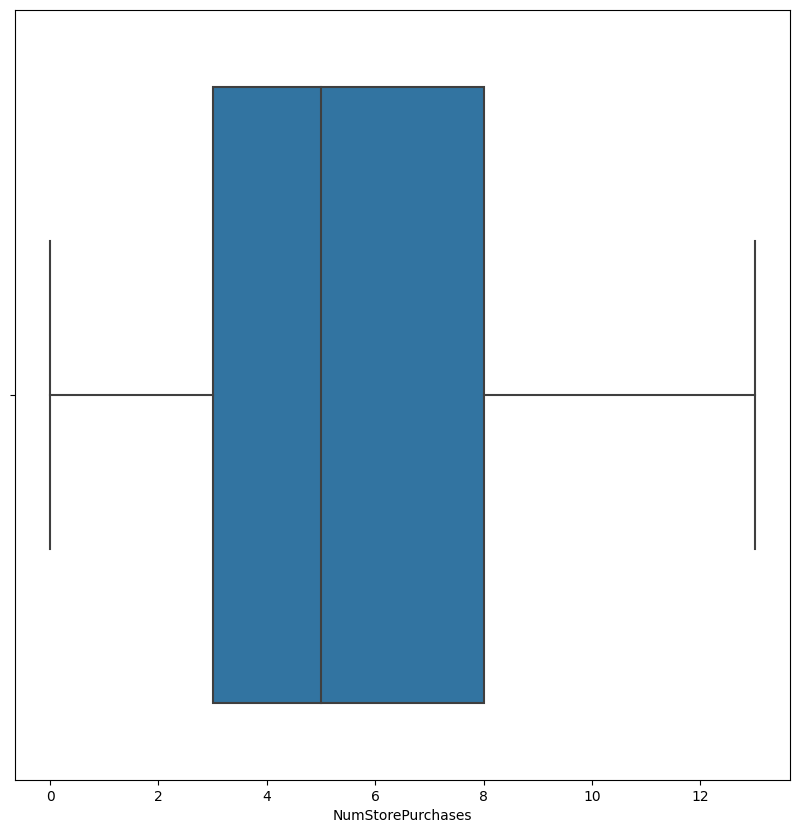

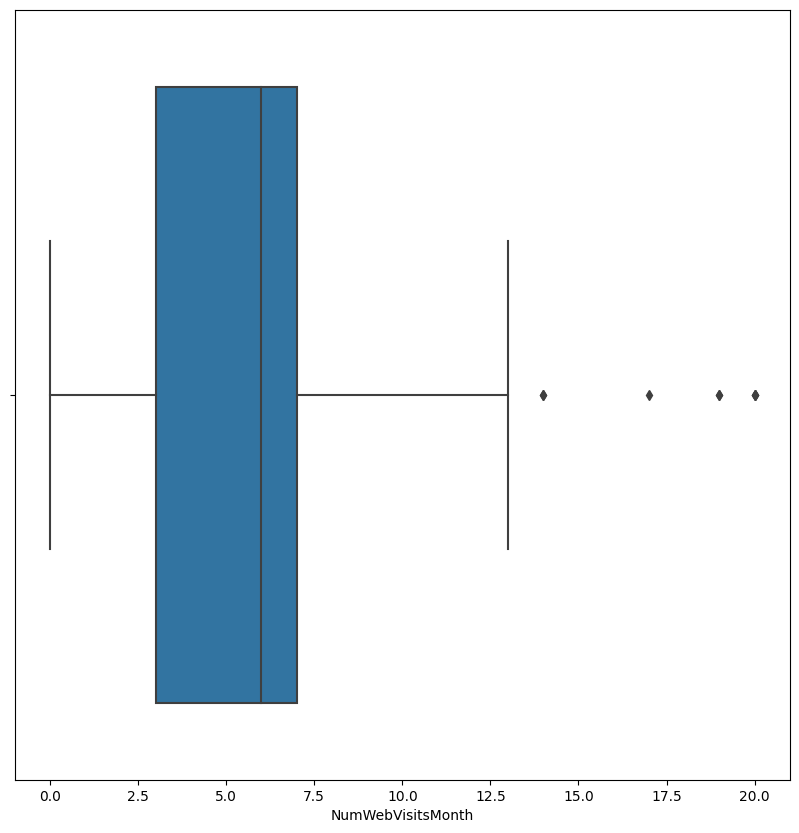

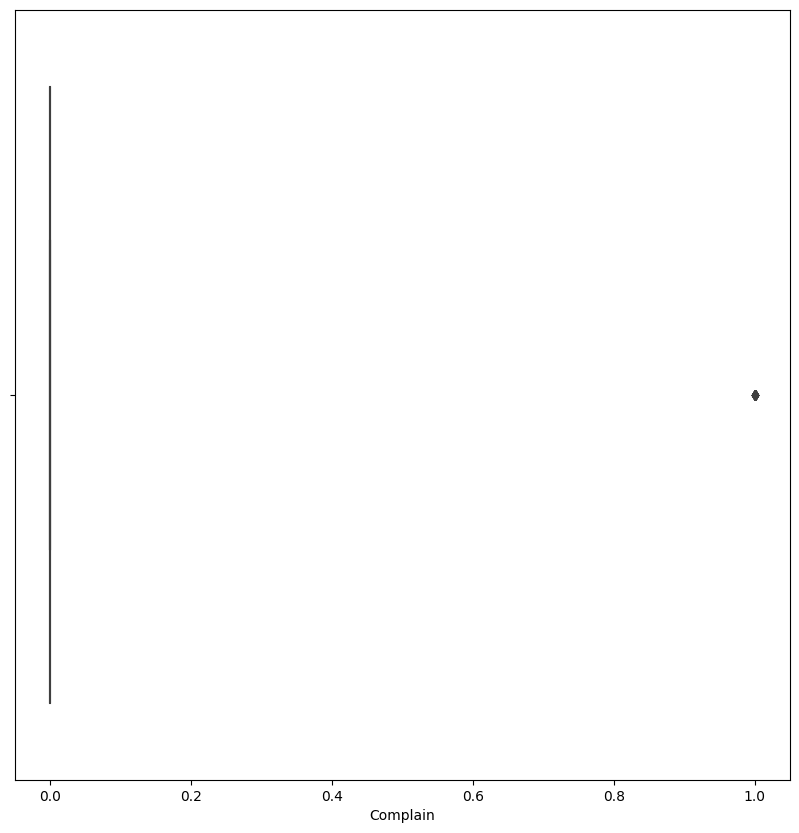

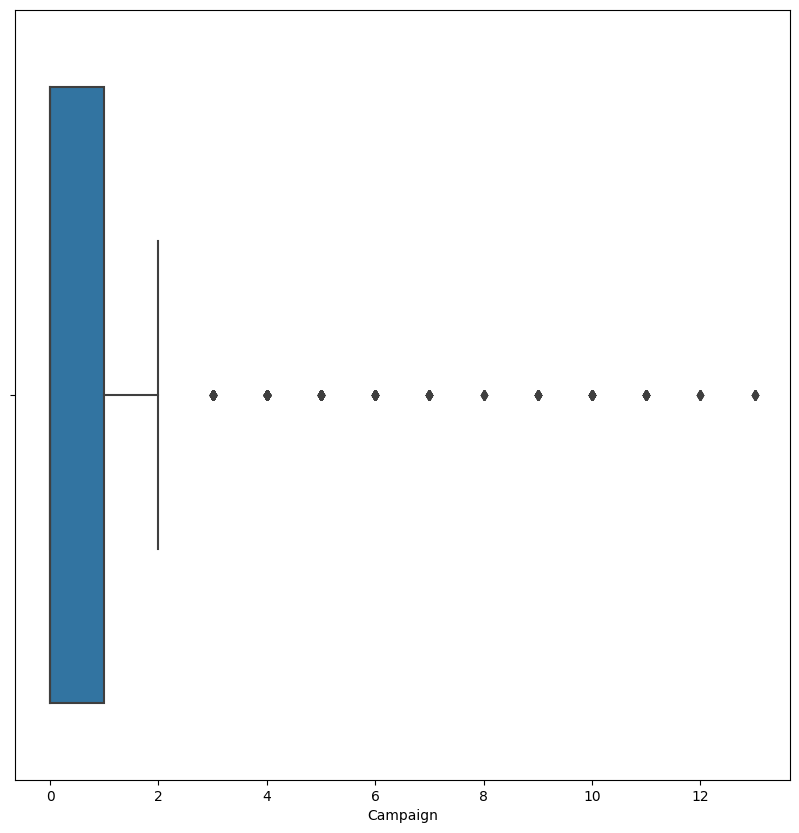

In [171]:
int_columns = df_customer.select_dtypes(exclude='object').columns
for _ in int_columns:
    plt.figure(figsize=(10,10))
    sns.boxplot(data=df_customer, x = _, orient='h')
    plt.show()

# Eliminación de Outliers 

In [243]:
df_customer[df_customer['Income']> 500000] 
df_customer.drop(df_customer[df_customer['Income']> 500000].index,inplace=True )

In [244]:
df_customer[df_customer['Age']> 100 ]
df_customer.drop(df_customer[df_customer['Age']> 100 ].index,inplace=True)

In [245]:
df_customer[df_customer['MntMeatProducts']> 1250 ]
df_customer.drop(df_customer[df_customer['MntMeatProducts']> 1250 ].index,inplace=True)

In [246]:
df_customer[df_customer['MntSweetProducts']> 230 ]
df_customer.drop(df_customer[df_customer['MntSweetProducts']> 230 ].index,inplace=True)

In [247]:
df_customer[df_customer['MntGoldProds']> 260 ]
df_customer.drop(df_customer[df_customer['MntGoldProds']> 260 ].index, inplace=True)

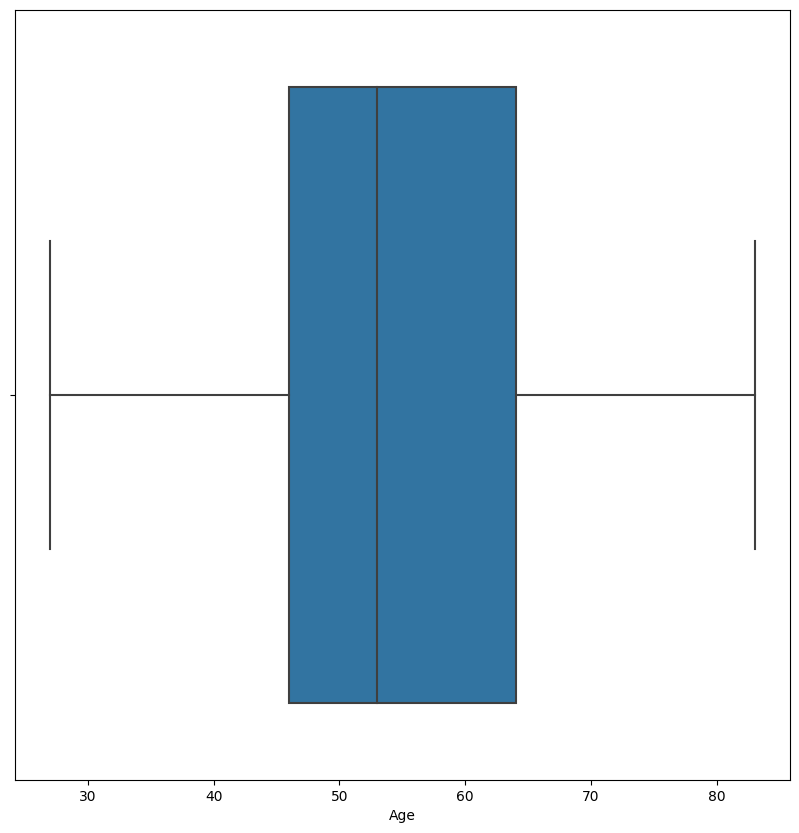

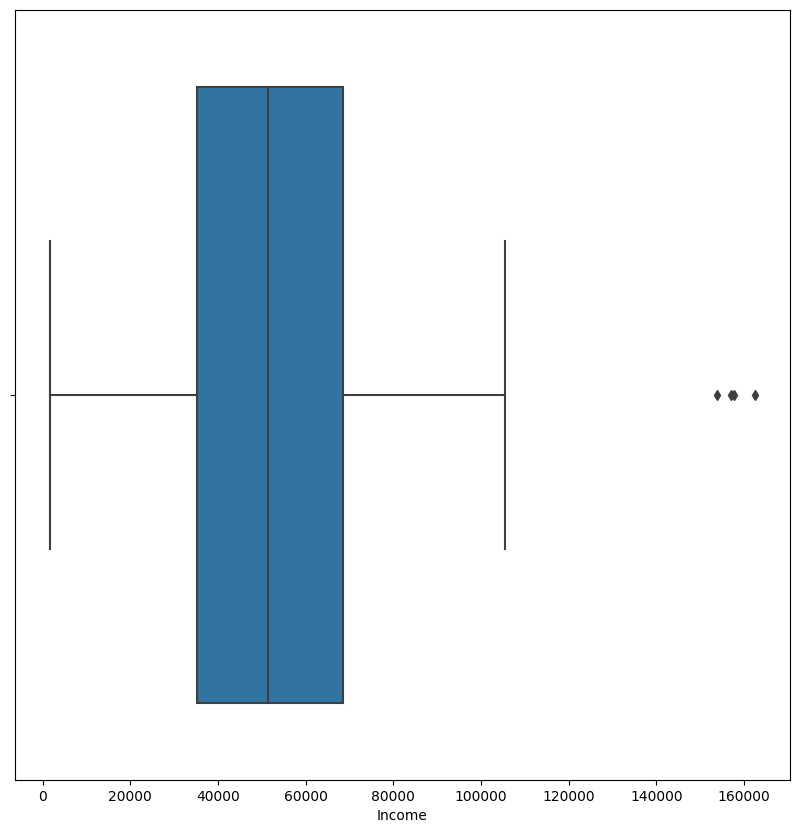

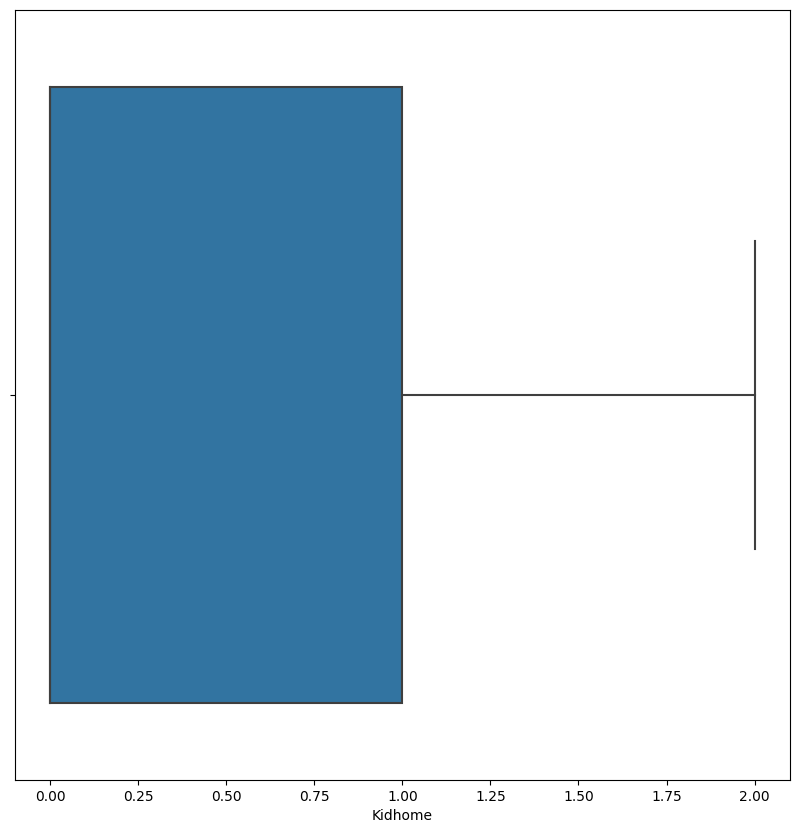

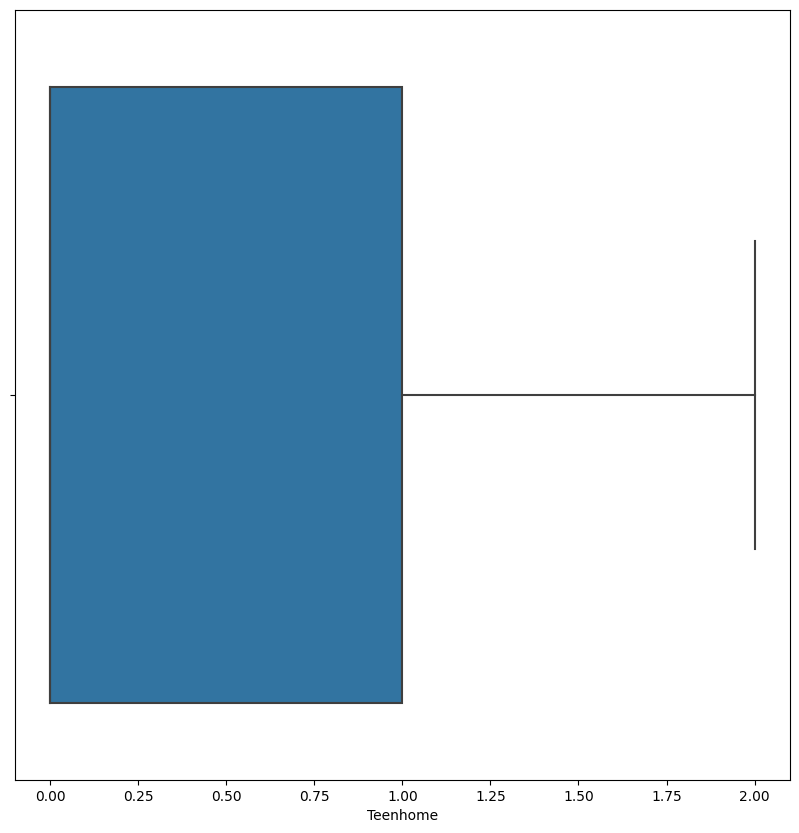

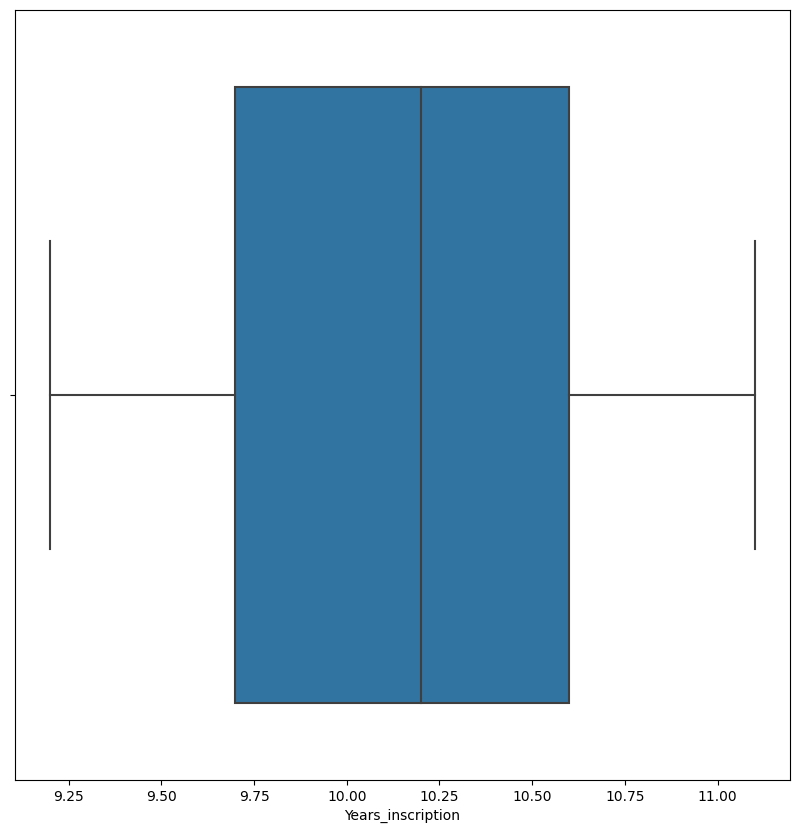

...

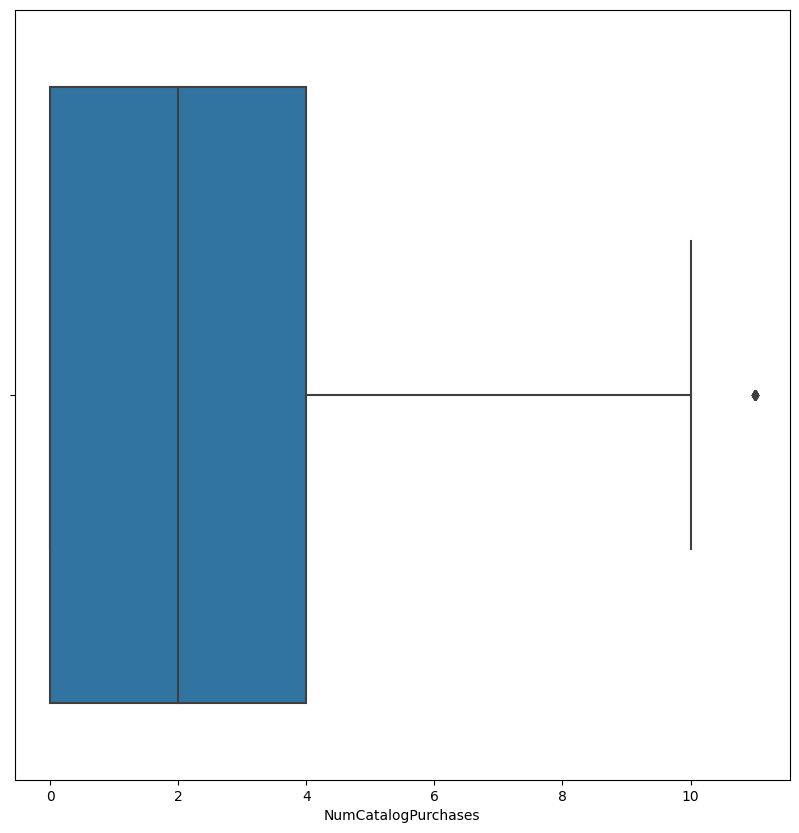

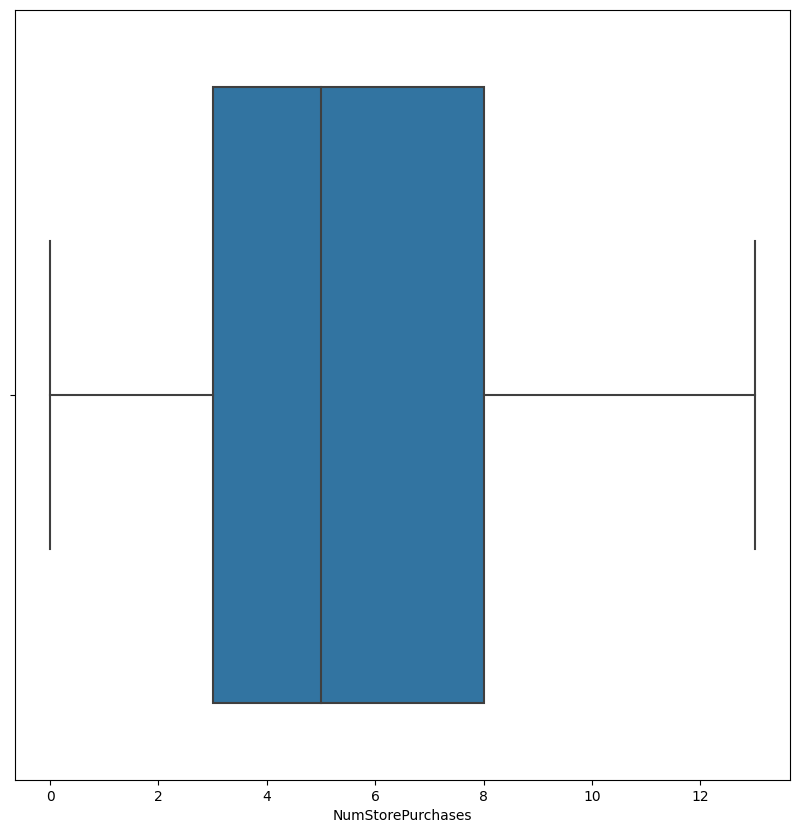

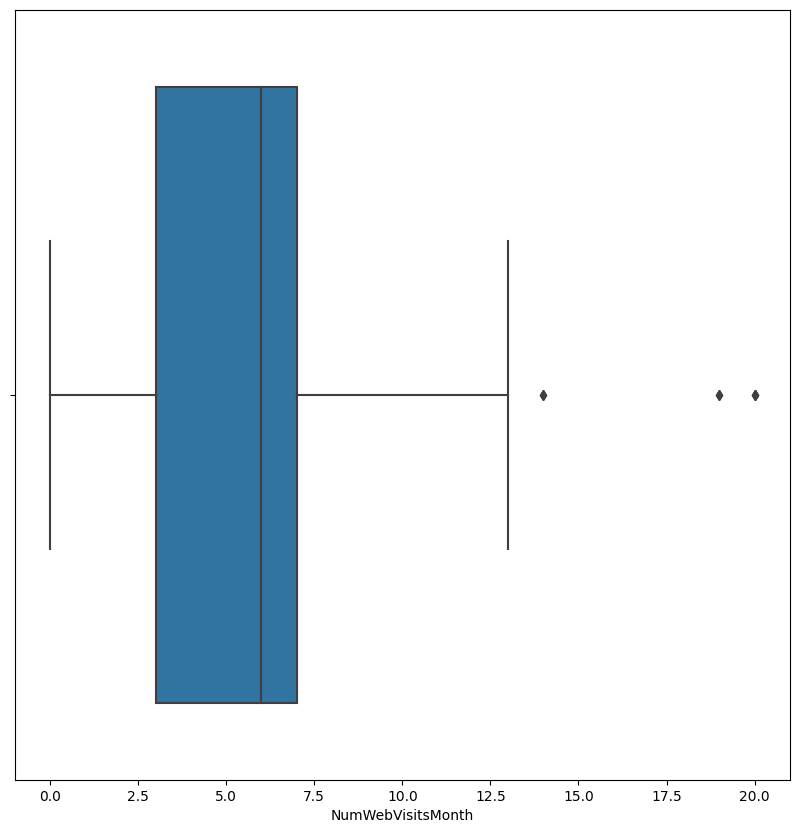

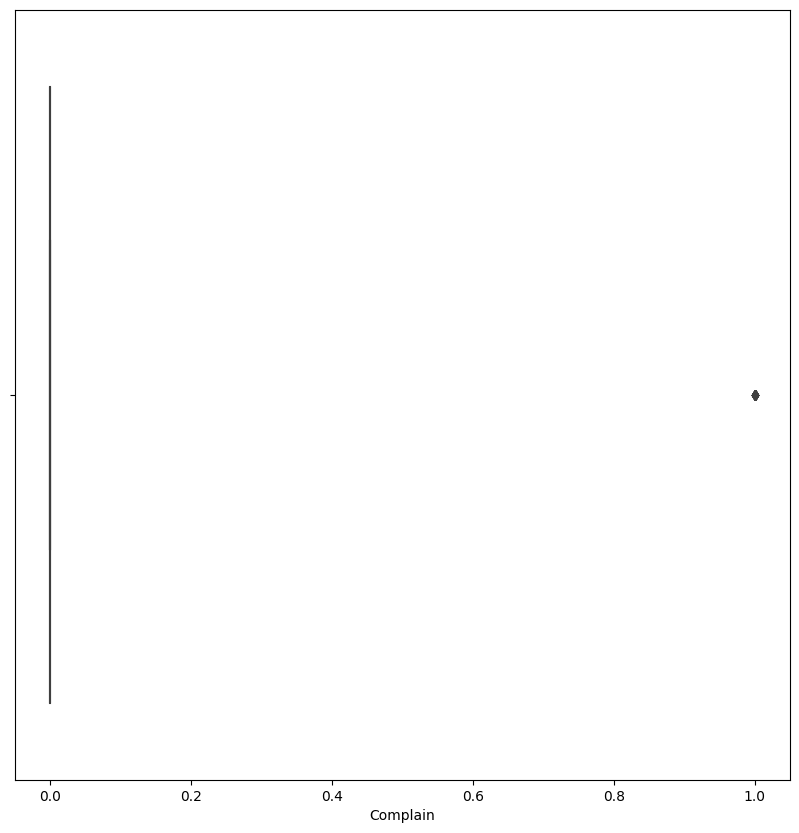

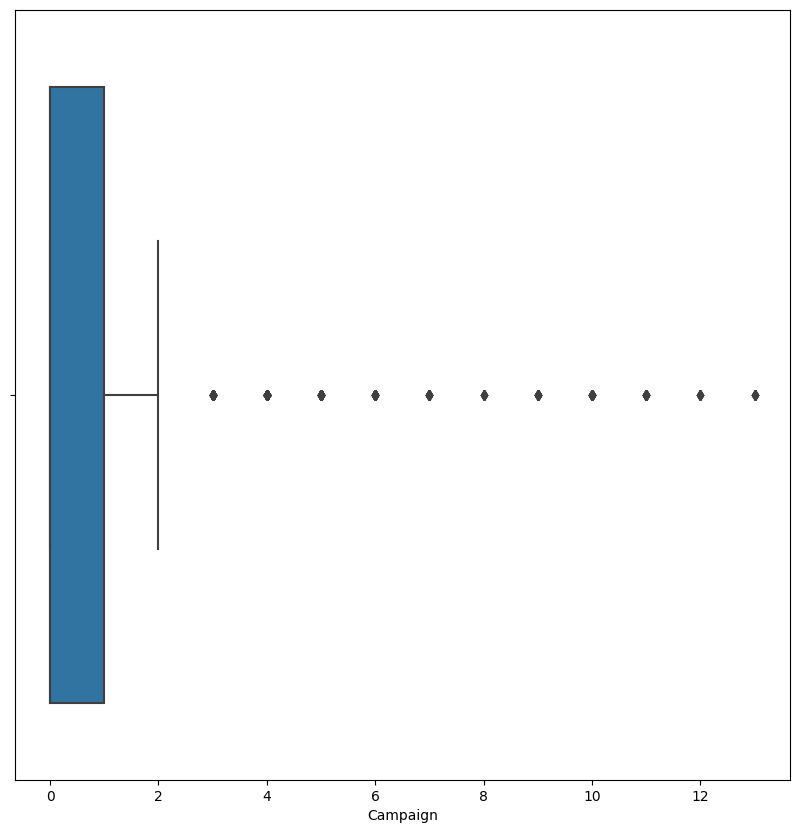

In [248]:
int_columns = df_customer.select_dtypes(exclude='object').columns
for _ in int_columns:
    plt.figure(figsize=(10,10))
    sns.boxplot(data=df_customer, x = _, orient='h')
    plt.show()

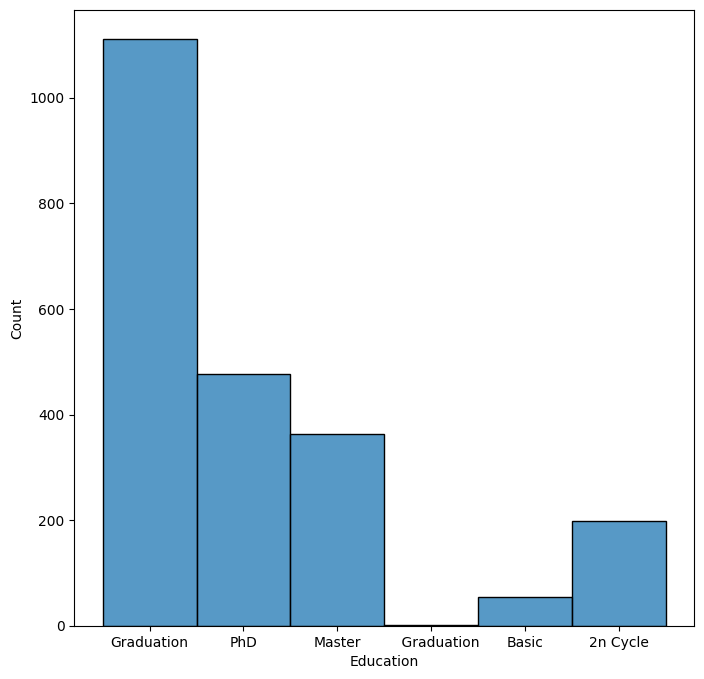

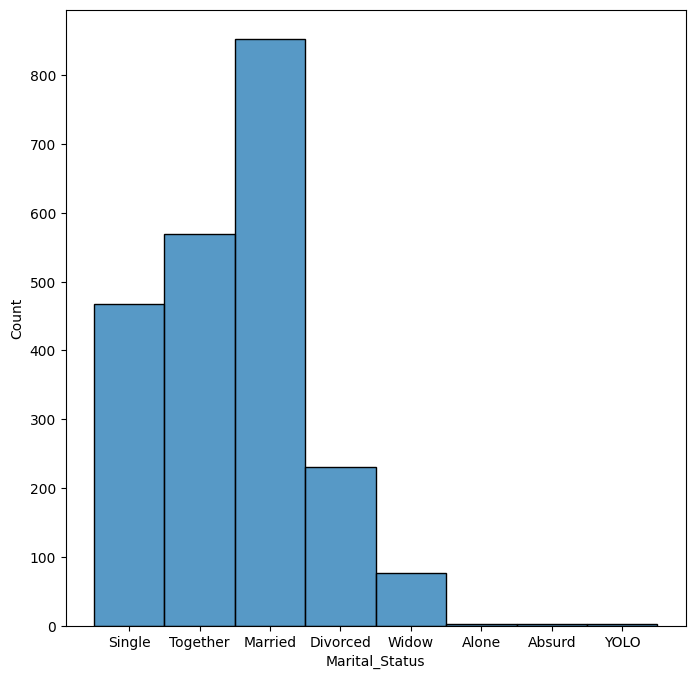

In [178]:
category_columns = df_customer.select_dtypes(exclude=['int','float'])
for _ in category_columns:
    fig = plt.figure(figsize=(8,8))
    sns.histplot(data=df_customer,x=_)

In [249]:
df_customer[(df_customer['Marital_Status']=='YOLO') | (df_customer['Marital_Status']=='Absurd')]

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,MntFruits,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Campaign
2093,30,Graduation,Absurd,79244.0,0,0,10.7,58,471,102,...,212,61,245,1,4,10,7,1,0,7
2134,66,Master,Absurd,65487.0,0,0,9.6,48,240,67,...,199,0,163,3,3,5,6,2,0,0
2177,50,PhD,YOLO,48432.0,0,1,10.9,3,322,3,...,4,3,42,5,7,1,6,8,0,0
2202,50,PhD,YOLO,48432.0,0,1,10.9,3,322,3,...,4,3,42,5,7,1,6,8,0,1


Se puede observar que existen muy pocos resultados para los campos de 'Absurd' y 'YOLO', por lo que se pueden borrar estos resultados, buscando mayor uniformidad en los mismos.

In [250]:
df_customer.drop(df_customer[(df_customer['Marital_Status']=='YOLO') | (df_customer['Marital_Status']=='Absurd')].index,inplace=True)

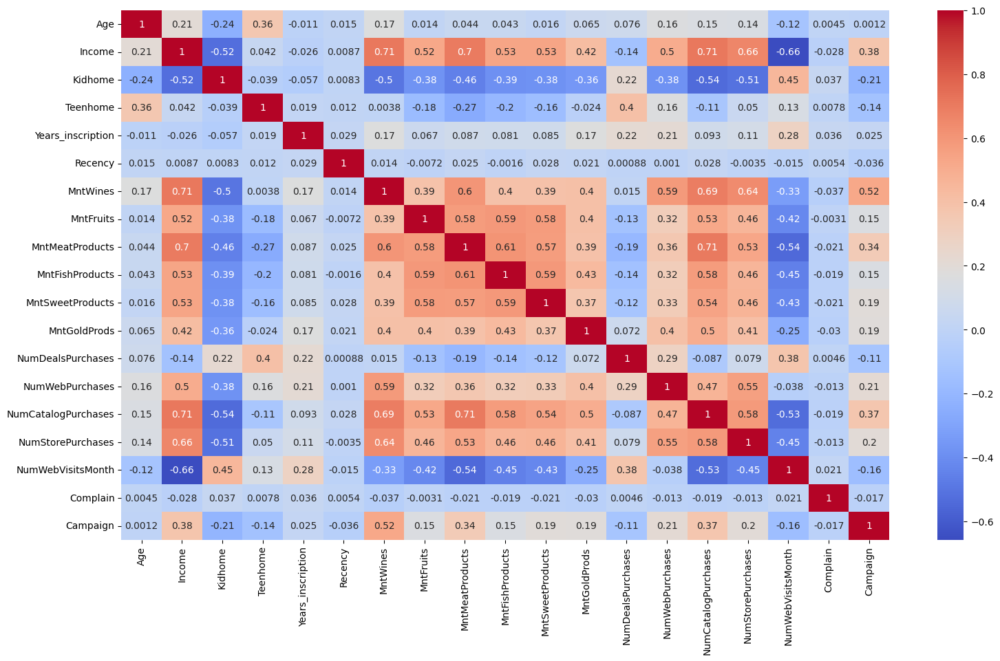

In [251]:
fig = plt.figure(figsize=(18,10))
numeric_corr = df_customer.corr(numeric_only=True)
sns.heatmap(data=numeric_corr,annot=True, cmap='coolwarm')
plt.show()

## Convertir columnas categóricas en numericas

In [252]:
import category_encoders as ce
encoder = ce.OrdinalEncoder(cols = df_customer.columns)
df_customer = encoder.fit_transform(df_customer)

In [253]:
df_customer

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,MntFruits,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Campaign
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1,2,1,1,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,1,2
2,3,1,2,3,1,1,3,3,3,3,...,3,3,3,3,1,3,3,3,1,2
3,4,1,2,4,2,1,4,3,2,4,...,4,4,4,2,3,4,1,4,1,2
4,5,2,3,5,2,1,4,4,4,5,...,5,5,5,4,4,5,4,2,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,6,1,3,1958,1,2,7,62,403,5,...,70,90,208,2,12,5,1,2,1,2
2236,15,2,2,1349,3,2,18,25,638,9,...,6,16,73,6,1,3,9,1,1,1
2237,5,1,4,1959,1,1,4,16,740,53,...,61,12,93,3,3,5,12,4,1,5
2238,45,3,2,1960,1,2,4,27,775,65,...,46,25,108,2,5,9,3,9,1,2


## Escalar datos

In [254]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
df_customer_scaled = scaler.fit_transform(df_customer)

In [255]:
df_customer_scaled = pd.DataFrame(
    data= df_customer_scaled, columns = df_customer.columns
)
df_customer_scaled

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,MntFruits,...,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Campaign
0,-1.619045,-0.718400,-1.419742,-1.653688,-0.825749,-0.930792,-1.571481,-1.720868,-1.189629,-0.933266,...,-0.950353,-0.970183,-1.114983,-1.120176,-1.491194,-1.400900,-1.422217,-1.229209,-0.095783,-0.843915
1,-1.548222,-0.718400,-1.419742,-1.651930,1.035570,0.909049,-1.401516,-1.685582,-1.184990,-0.904828,...,-0.926639,-0.943972,-1.094246,-0.597617,-1.137602,-1.016709,-1.140742,-0.890457,-0.095783,-0.345495
2,-1.477399,-0.718400,-0.469793,-1.650171,-0.825749,-0.930792,-1.231551,-1.650296,-1.180352,-0.876390,...,-0.902926,-0.917761,-1.073509,-0.075058,-1.491194,-0.632518,-0.859267,-0.551704,-0.095783,-0.345495
3,-1.406576,-0.718400,-0.469793,-1.648412,1.035570,-0.930792,-1.061586,-1.650296,-1.184990,-0.847951,...,-0.879212,-0.891550,-1.052772,-0.597617,-0.784010,-0.248327,-1.422217,-0.212952,-0.095783,-0.345495
4,-1.335753,-0.062327,0.480156,-1.646653,1.035570,-0.930792,-1.061586,-1.615010,-1.175714,-0.819513,...,-0.855499,-0.865338,-1.032035,0.447500,-0.430418,0.135864,-0.577792,-0.890457,-0.095783,-0.345495
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,-1.264930,-0.718400,0.480156,1.788281,-0.825749,0.909049,-0.551691,0.431580,0.674997,-0.819513,...,0.685882,1.362612,3.177546,-0.597617,2.398319,0.135864,-1.422217,-0.890457,-0.095783,-0.345495
2196,-0.627523,-0.062327,-0.469793,0.717173,2.896889,0.909049,1.317924,-0.874003,1.765015,-0.705760,...,-0.831785,-0.577015,0.378071,1.492618,-1.491194,-0.632518,0.829584,-1.229209,-0.095783,-0.843915
2197,-1.335753,-0.718400,1.430105,1.790040,-0.825749,-0.930792,-1.061586,-1.191577,2.238129,0.545523,...,0.472460,-0.681860,0.792808,-0.075058,-0.784010,0.135864,1.674009,-0.212952,-0.095783,1.149763
2198,1.497165,0.593746,-0.469793,1.791799,-0.825749,0.909049,-1.061586,-0.803431,2.400472,0.886783,...,0.116757,-0.341115,1.103860,-0.597617,-0.076826,1.672628,-0.859267,1.480809,-0.095783,-0.345495


## PCA

In [256]:
from sklearn.decomposition import PCA


In [257]:
pca = PCA()
pca.fit(df_customer_scaled)
pca_data_scaled = pca.transform(df_customer_scaled)
pca_data_scaled

array([[-3.43508253, -1.67204106, -0.70138238, ...,  0.21169338,
        -1.59001932,  0.92542728],
       [-3.66776622, -0.71403773, -1.07902994, ..., -0.63475365,
         0.03608341,  0.0075236 ],
       [-2.68641961, -1.72784417, -1.33498591, ...,  0.34927742,
        -1.37937385,  0.80645266],
       ...,
       [ 1.93517058,  1.4157091 , -0.40186056, ...,  0.38177992,
        -0.94993666, -0.4016837 ],
       [ 3.15402405,  1.29701807,  1.40723286, ..., -0.98806997,
         0.11274768, -0.40868236],
       [-2.02261472,  2.0547834 ,  0.70925845, ...,  0.14165979,
         1.08962538,  1.12382346]])

In [258]:
var = pca.explained_variance_ratio_
print(var)

[0.19578597 0.0712173  0.0583387  0.0540617  0.05063405 0.04934219
 0.0490532  0.04757097 0.0448098  0.04433185 0.04225209 0.04028389
 0.0374672  0.03522037 0.0326732  0.02878373 0.02778353 0.02425944
 0.02330262 0.02255722 0.02027101]


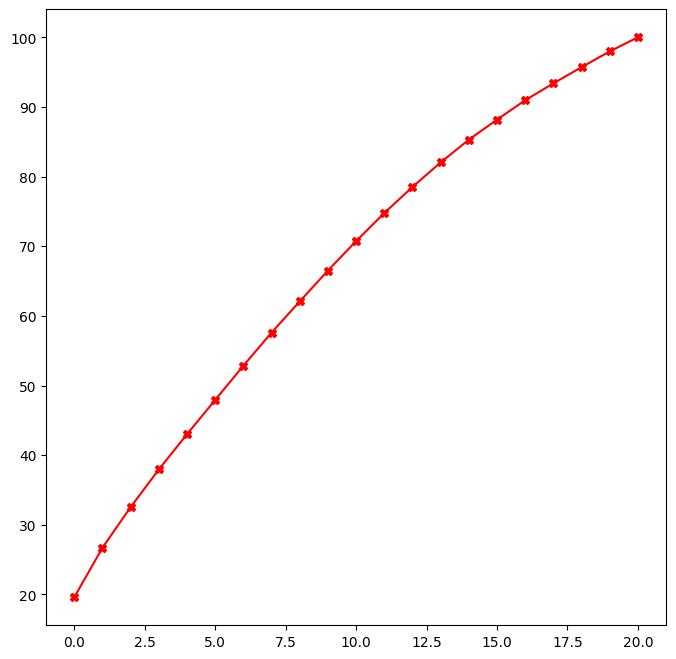

In [259]:
cum_var = np.cumsum(np.round(var,decimals=4)*100)
plt.figure(figsize=(8,8))
plt.plot(cum_var, color='red',marker='X')
plt.show()

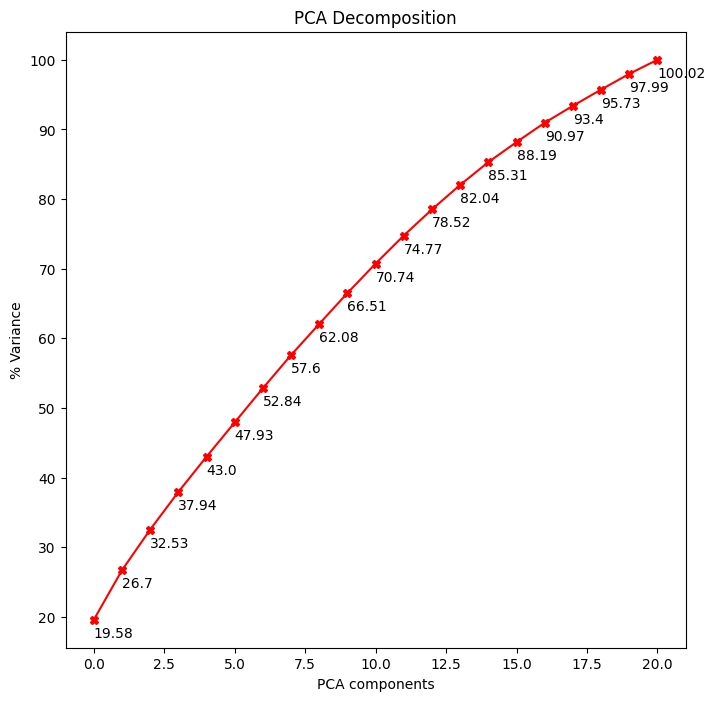

In [260]:
cum_var = np.cumsum(np.round(var,decimals=4)*100)
components = list(range(0,21))
plt.figure(figsize=(8,8))
for s,d in zip(components,cum_var):
    plt.annotate(np.round(d,decimals=2),xy=(s,d-2.5))
plt.plot(components,cum_var, color='red',marker='X')
plt.title('PCA Decomposition')
plt.xlabel('PCA components')
plt.ylabel('% Variance')
plt.show()

Se puede observar que con cuatro componentes principales se puede explicar el 87.18% de los datos, por lo cual se va opta por trabajar sólo con estos datos.

In [261]:
pca_data_standard = pd.DataFrame(pca_data_scaled)
pca_data_standard.drop([17,18,18,19,20],axis=1,inplace=True)


In [265]:
pca_data_standard

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16
0,-3.435083,-1.672041,-0.701382,2.316386,-0.029382,0.968575,-0.475884,0.530235,-1.726072,-0.793742,0.231562,-0.252127,0.773017,-0.991745,0.211718,0.105726,0.591065
1,-3.667766,-0.714038,-1.079030,1.652848,0.573876,1.087784,-0.437694,0.581990,-1.592337,-0.293581,0.556959,0.210376,1.055650,-1.034274,0.265889,-0.051970,-0.189550
2,-2.686420,-1.727844,-1.334986,1.381648,-0.089642,0.704673,-0.511490,1.118377,-1.021070,-0.334799,0.562296,0.277128,0.294311,-0.904224,0.019985,0.082668,0.385760
3,-3.052925,-1.874496,-0.813563,1.429971,0.046654,0.886334,-0.715166,1.387644,-0.646933,-0.162109,-0.160448,0.109478,0.504868,-0.430002,-0.030782,-0.374142,-0.362195
4,-2.778402,-1.362696,-1.498184,1.036089,0.495975,-0.103276,-0.678773,1.424339,-0.065153,0.194905,0.131488,0.526205,0.221349,0.157095,0.246347,-0.506561,-0.819630
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2195,2.727352,3.079490,0.509888,1.645044,-0.299620,-0.348581,0.181850,0.626935,-0.310185,-0.030539,-2.233010,-0.875744,1.577746,0.304417,-1.127828,-2.046505,0.506734
2196,-1.991436,2.317466,0.845793,-0.304529,0.927274,0.771204,-1.323128,-0.062218,0.112685,1.332561,1.852841,1.476116,0.327833,1.190242,-0.603668,0.143095,-0.302490
2197,1.935171,1.415709,-0.401861,1.557830,-0.771751,0.128387,-0.091970,2.118224,-0.329263,-0.373516,1.448376,0.293517,-0.976680,1.566280,-0.265426,1.330731,0.330342
2198,3.154024,1.297018,1.407233,0.614579,0.445927,0.359980,-0.326690,0.078125,-0.006852,-2.263735,0.419025,-0.553239,-1.293559,-1.417921,-1.626259,-0.343098,-0.969597


## Importar librerías para clustering

In [266]:
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage, dendrogram

## K-means

### PCA

In [267]:
sum_of_squared_distances = []
silhouette_scores = []
K = range(2,16)
for _ in K:
    km = KMeans(n_clusters=_,n_init=10)
    y = km.fit_predict(pca_data_standard)
    sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(pca_data_standard,y))

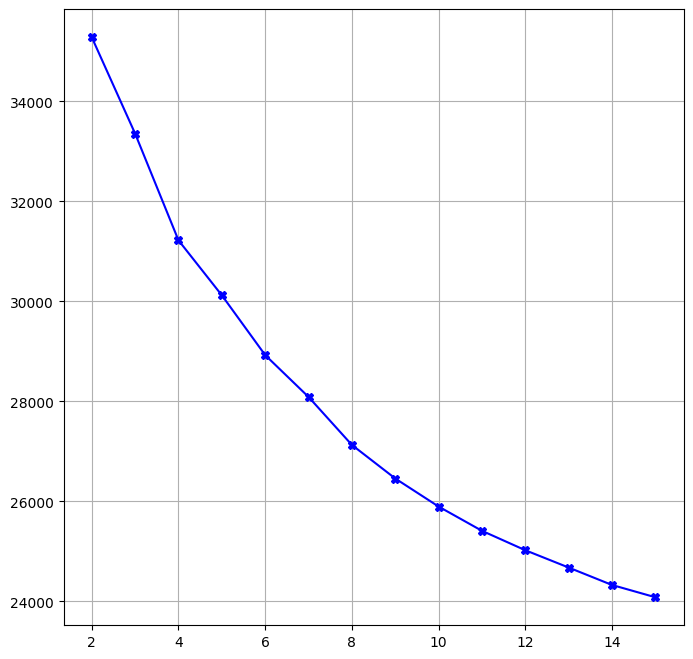

In [268]:
fig = plt.figure(figsize=(8,8))
plt.plot(K,sum_of_squared_distances,color='blue',marker='X')
plt.grid()
plt.show()


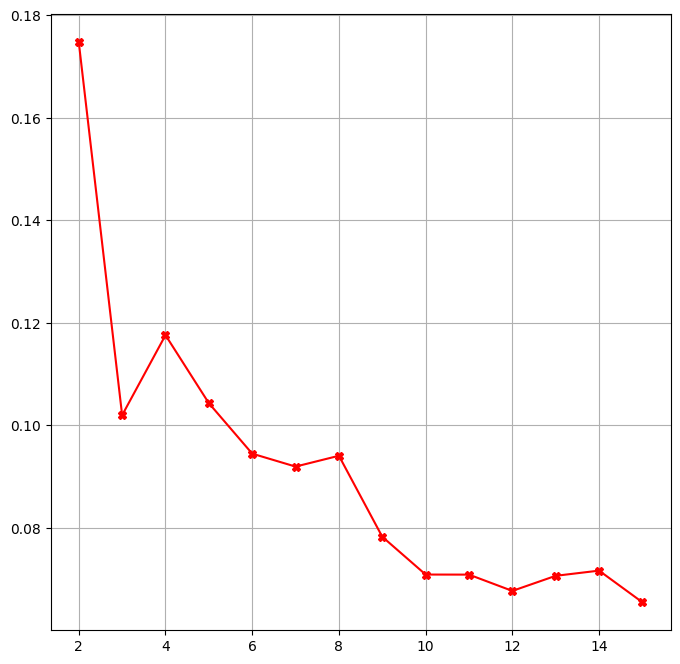

In [269]:
fig = plt.figure(figsize=(8,8))
plt.plot(K,silhouette_scores,color='red',marker='X')
plt.grid()
plt.show()

Se puede observar que es suficiente utilizar 4 clusters para agrupar los datos cuando se usa Kmeans con PCA

In [270]:
km = KMeans(n_clusters=4,n_init=10)
y_kmeans_pca = km.fit_predict(pca_data_scaled)
print(silhouette_score(pca_data_standard,y_kmeans_pca ))
df_customer['kmeans_pca'] = y_kmeans_pca 

0.10212247434847793


### Sin PCA

In [271]:
sum_of_squared_distances = []
silhouette_scores = []
K = range(2,16)
for _ in K:
    km = KMeans(n_clusters=_,n_init=10)
    y = km.fit_predict(df_customer_scaled)
    sum_of_squared_distances.append(km.inertia_)
    silhouette_scores.append(silhouette_score(df_customer_scaled,y))

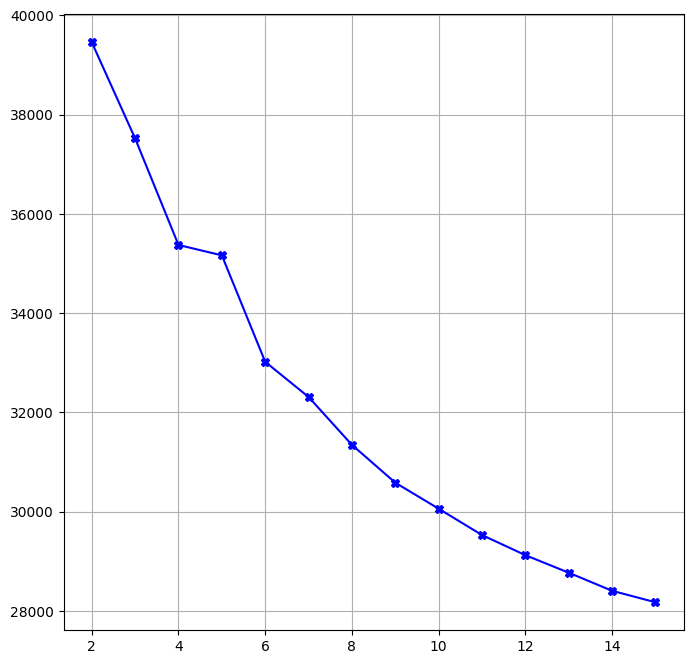

In [272]:
fig = plt.figure(figsize=(8,8))
plt.plot(K,sum_of_squared_distances,color='blue',marker='X')
plt.grid()
plt.show()

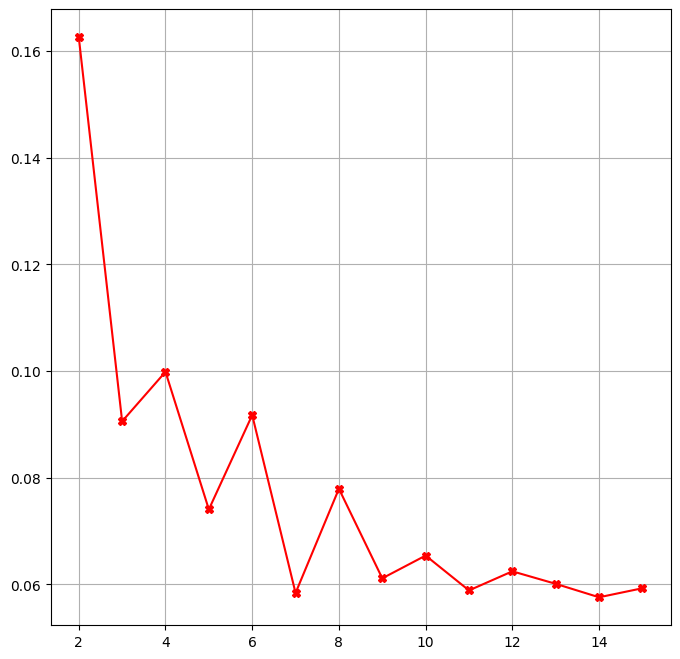

In [273]:
fig = plt.figure(figsize=(8,8))
plt.plot(K,silhouette_scores,color='red',marker='X')
plt.grid()
plt.show()

Se puede observar que se requieren 4 clusters para agrupar los datos cuando se usa Kmeans sin PCA

In [274]:
km = KMeans(n_clusters=4,n_init=10)
y_kmeans = km.fit_predict(df_customer_scaled)
print(silhouette_score(df_customer_scaled,y_kmeans))
df_customer['kmeans'] = y_kmeans 

0.09043458542094895


## Agglomerativen hierarchical clustering

### PCA

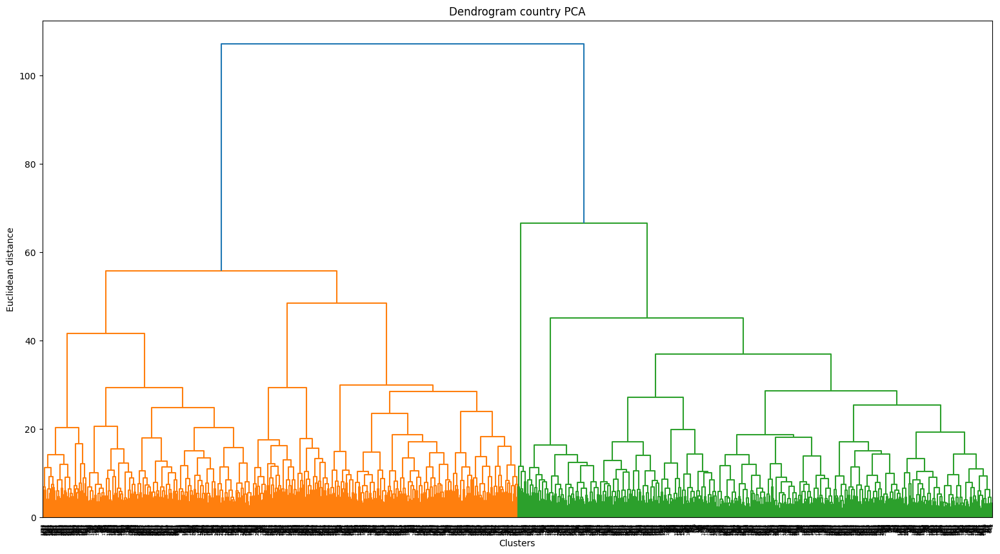

In [275]:
fig = plt.figure(figsize=(19,10))
dendrogram_plot = dendrogram(linkage(pca_data_standard,method='ward'))
plt.title('Dendrogram country PCA')
plt.xlabel('Clusters')
plt.ylabel('Euclidean distance')
plt.show()

In [276]:
hc_pca = AgglomerativeClustering(n_clusters=2,affinity='euclidean',linkage='ward')
y_hc_pca = hc_pca.fit_predict(pca_data_standard)
print(silhouette_score(pca_data_standard,y_hc_pca))
df_customer['hc_pca'] = y_hc_pca

/home/nico9779/anaconda3/envs/clustering/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


0.13326279930197227


### Sin PCA

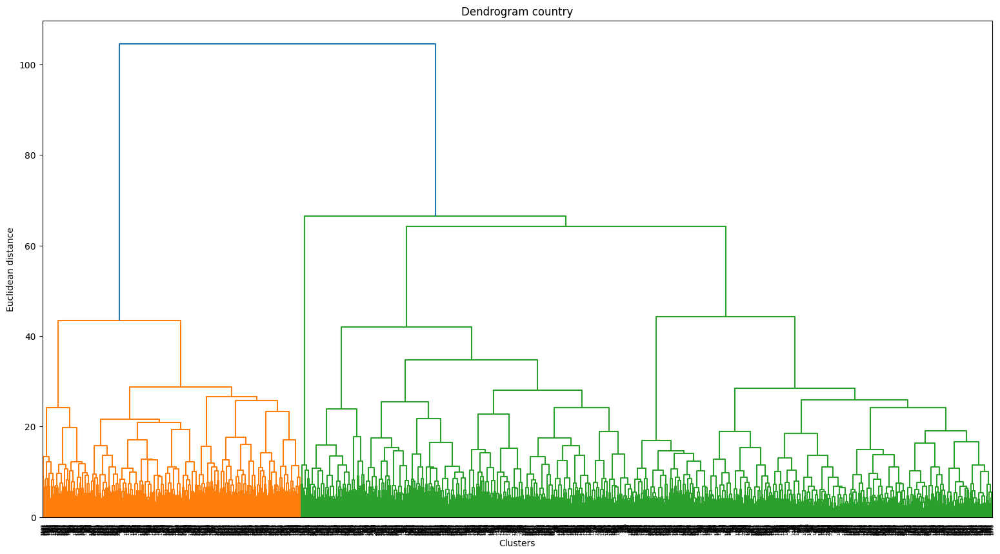

In [277]:
fig = plt.figure(figsize=(19,10))
dendrogram_plot = dendrogram(linkage(df_customer_scaled,method='ward'))
plt.title('Dendrogram country')
plt.xlabel('Clusters')
plt.ylabel('Euclidean distance')
plt.show()

In [281]:
hc = AgglomerativeClustering(n_clusters=3,affinity='euclidean',linkage='ward')
y_hc = hc.fit_predict(df_customer_scaled)
print(silhouette_score(df_customer_scaled,y_hc))
df_customer['hc'] = y_hc

/home/nico9779/anaconda3/envs/clustering/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1005: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


0.16842164527351866


## DBSCAN

### PCA

In [282]:
from sklearn.neighbors import NearestNeighbors
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(pca_data_standard)
distances, index = neighbors_fit.kneighbors(pca_data_standard)

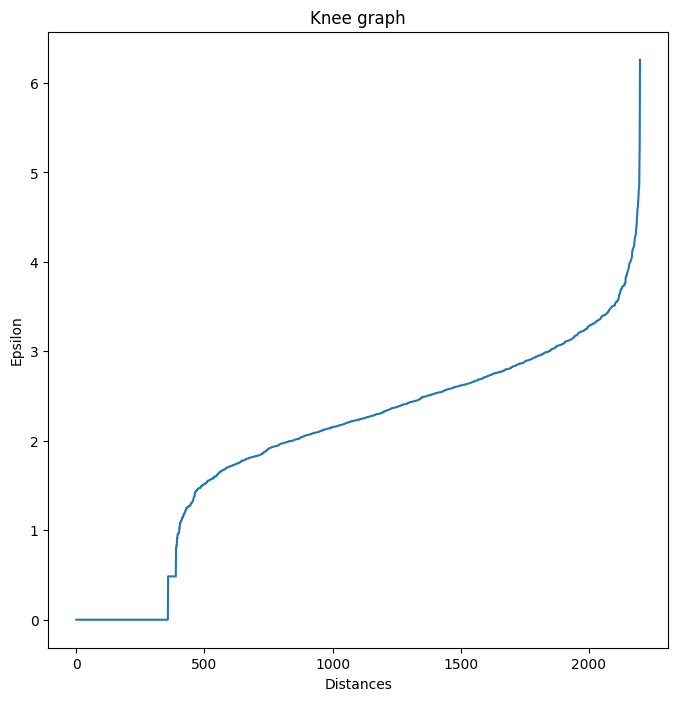

In [283]:
distances = np.sort(distances, axis = 0)
distances = distances[:,1]
fig = plt.figure(figsize=(8,8))
plt.plot(distances)
plt.title('Knee graph')
plt.xlabel('Distances')
plt.ylabel('Epsilon')
plt.show()

In [297]:
eps_values = np.arange(2.5,4,5.1)
min_samples_values = np.arange(3,12)

In [298]:
from itertools import product
dbscan_params = list(product(eps_values,min_samples_values))
n_cluster = []
silhouette_scores = []
for p in dbscan_params:
    y_dbscan_pca = DBSCAN(eps=p[0],min_samples=p[1]).fit_predict(pca_data_standard)
    try :
        silhouette_scores.append(silhouette_score(pca_data_standard,   y_dbscan_pca))
    except:
        silhouette_scores.append(0)
    n_cluster.append(len(np.unique(y_dbscan_pca)))

In [292]:
df_param_pca_tunning = pd.DataFrame.from_records(dbscan_params,columns=['Eps','Min_samples'])
df_param_pca_tunning['sil_score'] = silhouette_scores
df_param_pca_tunning['n_cluster'] = n_cluster

In [299]:
pivot_sil_score_pca = pd.pivot_table(df_param_pca_tunning,values = 'sil_score',columns='Eps',index='Min_samples')
pivot_n_cluster_pca = pd.pivot_table(df_param_pca_tunning,values = 'n_cluster',columns='Eps',index='Min_samples')

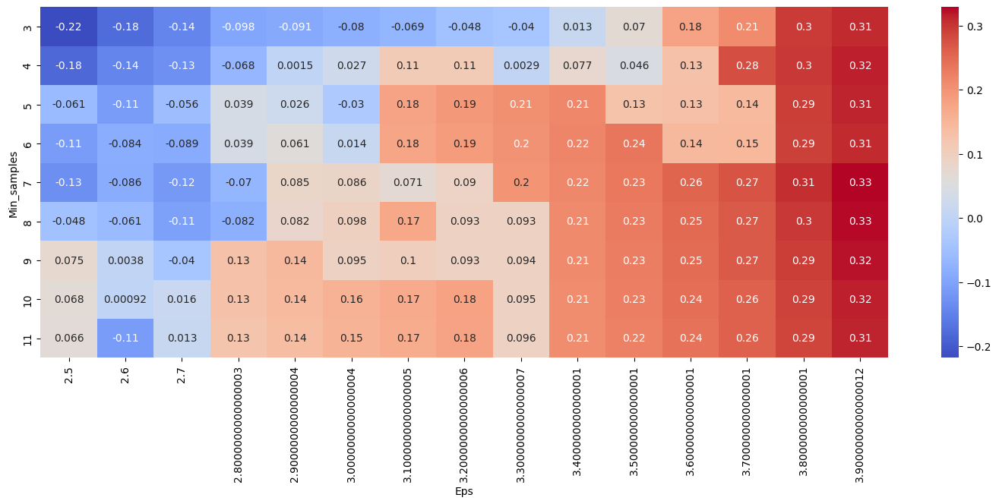

In [300]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_sil_score_pca, annot =True, annot_kws={'size':10},cmap='coolwarm', ax = ax )
plt.show()

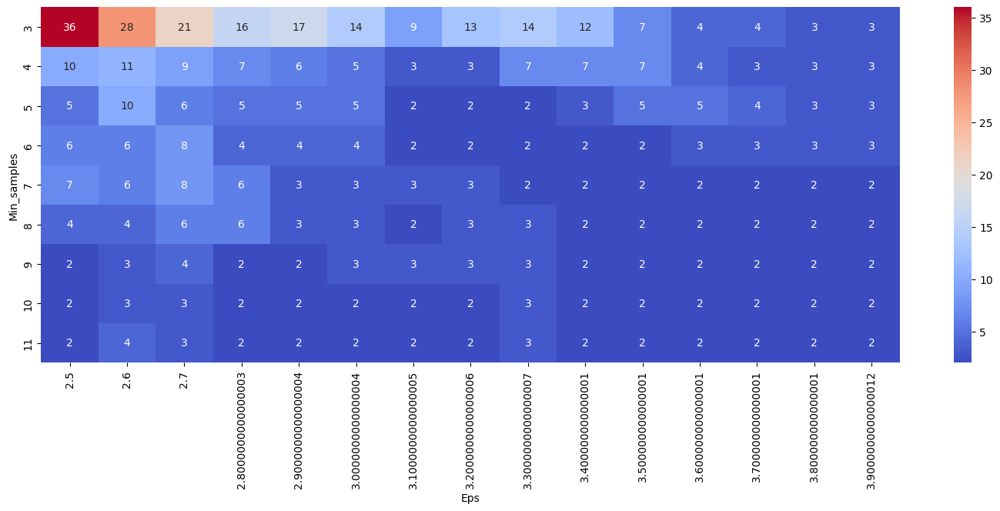

In [295]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_n_cluster_pca, annot =True, annot_kws={'size':10},cmap='coolwarm', ax = ax )
plt.show()

Debido a que para tener altos coeficientes de silueta se crean pocos clusters, se opta por tomar unos hiperparámetros mas ajustados, que tengan un balance entre numero de cluster, baja cantidad de puntos minimos, bajo epsilon y el mayor coeficiente que les acompañe, en este caso la mejor opción es la que tiene las siguientes caracteristicas:

- **Min_samples**: 4
- **Eps**: 3.9

In [301]:
dbscan_train_pca = DBSCAN(eps=3.9,min_samples=4)
y_dbscan_pca = dbscan_train_pca.fit_predict(pca_data_standard)
print(silhouette_score(pca_data_standard,y_dbscan_pca))
df_customer['dbscan_pca'] = y_dbscan_pca

0.316027781275527


### Sin PCA

In [302]:
neighbors = NearestNeighbors(n_neighbors=2)
neighbors_fit = neighbors.fit(df_customer_scaled)
distances, index = neighbors_fit.kneighbors(df_customer_scaled)

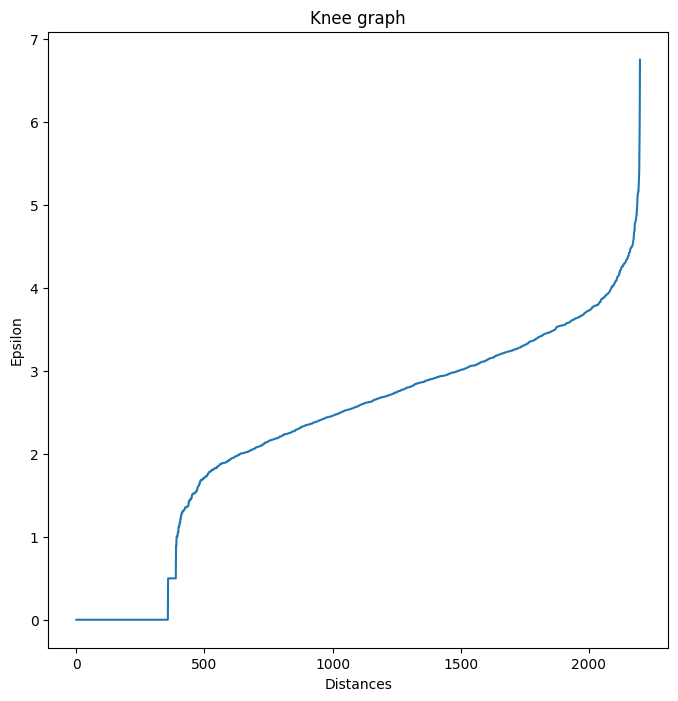

In [303]:
distances = np.sort(distances, axis = 0)
distances = distances[:,1]
fig = plt.figure(figsize=(8,8))
plt.plot(distances)
plt.title('Knee graph')
plt.xlabel('Distances')
plt.ylabel('Epsilon')
plt.show()

In [305]:
eps_values = np.arange(2.5,5,0.1)
min_samples_values = np.arange(3,12)

In [306]:
from itertools import product
dbscan_params = list(product(eps_values,min_samples_values))
n_cluster = []
silhouette_scores = []
for p in dbscan_params:
    y_dbscan = DBSCAN(eps=p[0],min_samples=p[1]).fit_predict(df_customer_scaled)
    try :
        silhouette_scores.append(silhouette_score(df_customer_scaled, y_dbscan))
    except:
        silhouette_scores.append(0)
    n_cluster.append(len(np.unique(y_dbscan)))

In [307]:
df_param_tunning = pd.DataFrame.from_records(dbscan_params,columns=['Eps','Min_samples'])
df_param_tunning['sil_score'] = silhouette_scores
df_param_tunning['n_cluster'] = n_cluster

In [308]:
pivot_sil_score = pd.pivot_table(df_param_tunning,values = 'sil_score',columns='Eps',index='Min_samples')
pivot_n_cluster = pd.pivot_table(df_param_tunning,values = 'n_cluster',columns='Eps',index='Min_samples')

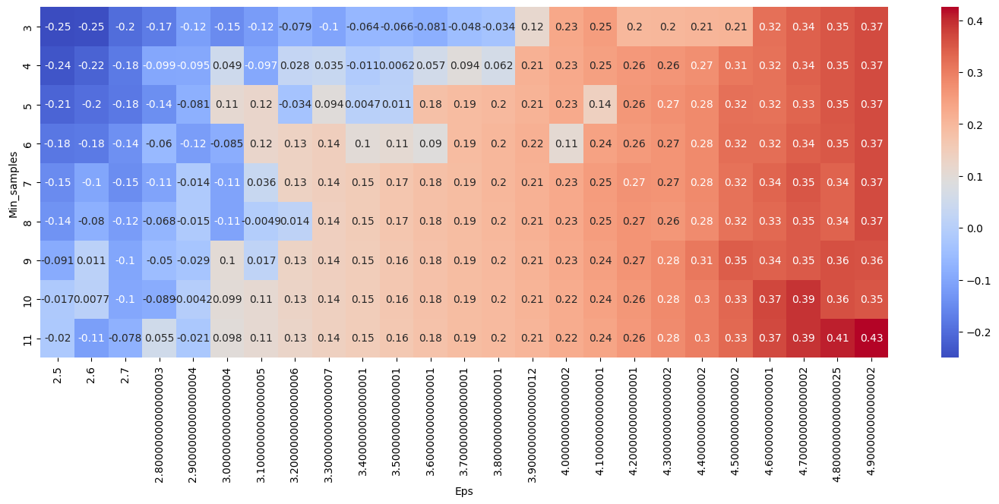

In [309]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_sil_score, annot =True, annot_kws={'size':10},cmap='coolwarm', ax = ax )
plt.show()

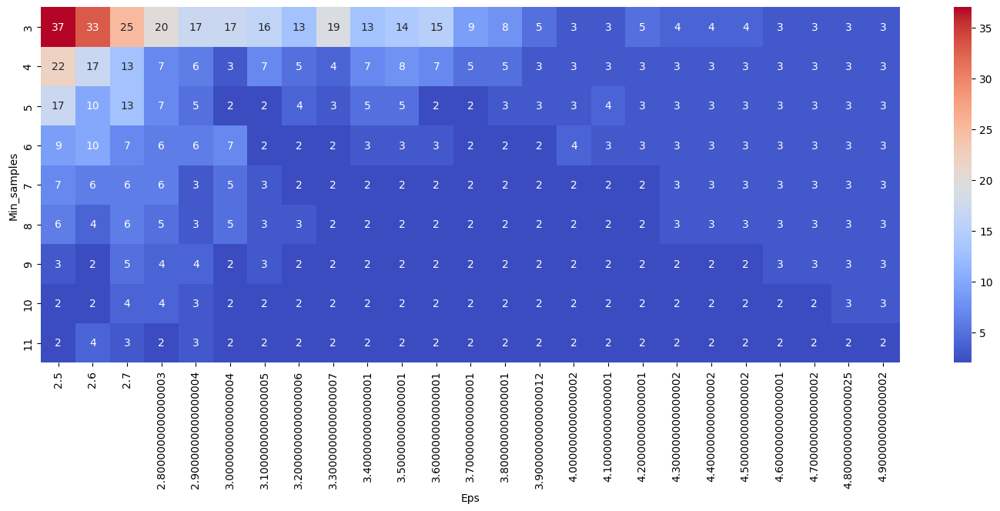

In [310]:
fig, ax = plt.subplots(figsize=(18,6))
sns.heatmap(pivot_n_cluster, annot =True, annot_kws={'size':10},cmap='coolwarm', ax = ax )
plt.show()

En el caso de no usar PCA, para tener altos coeficientes de silueta se crean pocos clusters, se opta por tomar unos hiperparámetros mas ajustados, que tengan un balance entre numero de cluster, baja cantidad de puntos minimos, bajo epsilon y el mayor coeficiente que les acompañe, en este caso la mejor opción es la que tiene las siguientes caracteristicas:

- **Min_samples**: 3
- **Eps**: 4.9

In [311]:
dbscan_train = DBSCAN(eps=4.9,min_samples=3)
y_dbscan = dbscan_train.fit_predict(df_customer_scaled)
print(silhouette_score(df_customer_scaled,y_dbscan))
df_customer['dbscan_cluster'] = y_dbscan

0.3668972489218816


## Evaluación de resultados

In [312]:
df_customer

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,MntFruits,...,NumStorePurchases,NumWebVisitsMonth,Complain,Campaign,kmeans_pca,kmeans,hc_pca,hc,dbscan_pca,dbscan_cluster
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,3,1,0,0,0,0
1,2,1,1,2,2,2,2,2,2,2,...,2,2,1,2,3,1,0,0,0,0
2,3,1,2,3,1,1,3,3,3,3,...,3,3,1,2,3,1,0,0,0,0
3,4,1,2,4,2,1,4,3,2,4,...,1,4,1,2,3,1,0,0,0,0
4,5,2,3,5,2,1,4,4,4,5,...,4,2,1,2,3,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,6,1,3,1958,1,2,7,62,403,5,...,1,2,1,2,2,0,1,1,0,0
2236,15,2,2,1349,3,2,18,25,638,9,...,9,1,1,1,3,1,1,0,0,0
2237,5,1,4,1959,1,1,4,16,740,53,...,12,4,1,5,2,0,1,0,0,0
2238,45,3,2,1960,1,2,4,27,775,65,...,3,9,1,2,2,0,1,1,0,0


In [313]:
df_customer.columns 

Index(['Age', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Years_inscription', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Complain', 'Campaign', 'kmeans_pca', 'kmeans', 'hc_pca', 'hc',
       'dbscan_pca', 'dbscan_cluster'],
      dtype='object')

In [314]:
df_customer[['Age', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Years_inscription', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Complain', 'Campaign','dbscan_cluster']]

,Age,Education,Marital_Status,Income,Kidhome,Teenhome,Years_inscription,Recency,MntWines,MntFruits,...,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Campaign,dbscan_cluster
0,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,0
1,2,1,1,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,1,2,0
2,3,1,2,3,1,1,3,3,3,3,...,3,3,3,1,3,3,3,1,2,0
3,4,1,2,4,2,1,4,3,2,4,...,4,4,2,3,4,1,4,1,2,0
4,5,2,3,5,2,1,4,4,4,5,...,5,5,4,4,5,4,2,1,2,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,6,1,3,1958,1,2,7,62,403,5,...,90,208,2,12,5,1,2,1,2,0
2236,15,2,2,1349,3,2,18,25,638,9,...,16,73,6,1,3,9,1,1,1,0
2237,5,1,4,1959,1,1,4,16,740,53,...,12,93,3,3,5,12,4,1,5,0
2238,45,3,2,1960,1,2,4,27,775,65,...,25,108,2,5,9,3,9,1,2,0


/home/nico9779/anaconda3/envs/clustering/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


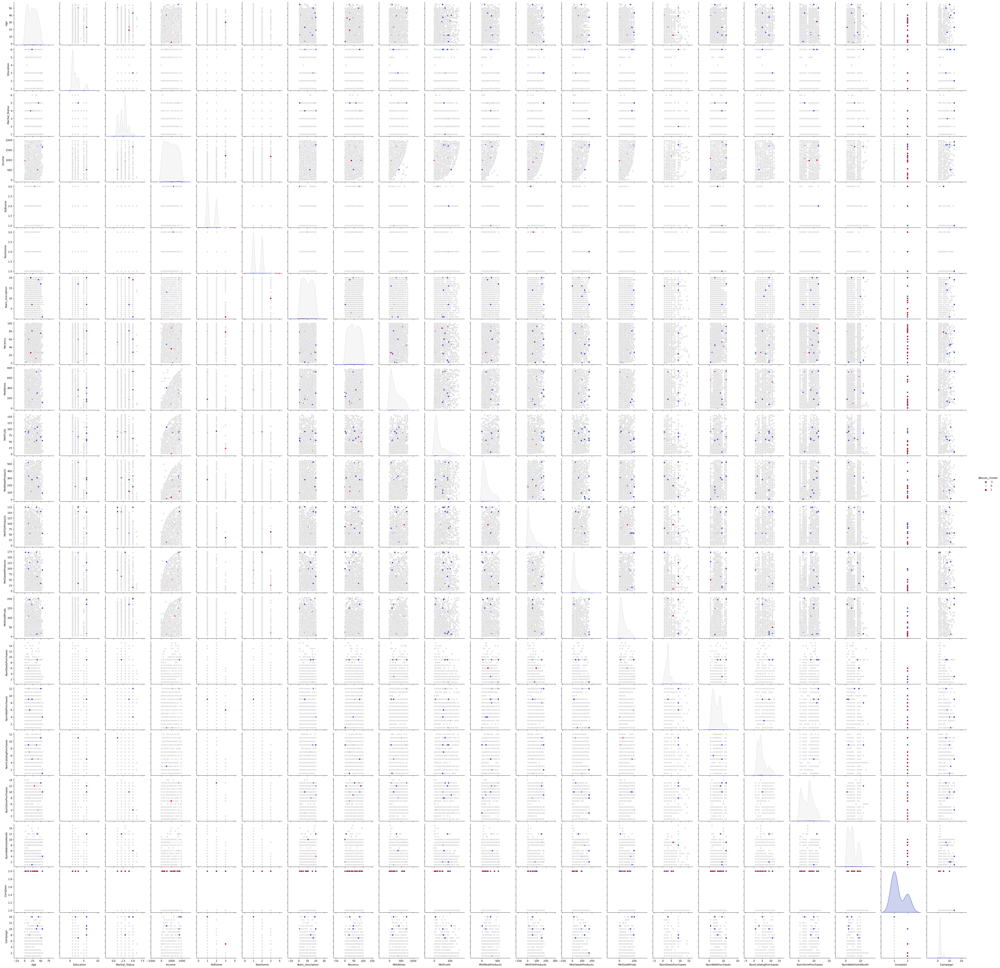

In [315]:
sns.pairplot(data = df_customer[['Age', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Years_inscription', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Complain', 'Campaign','dbscan_cluster']],hue='dbscan_cluster', palette='coolwarm')

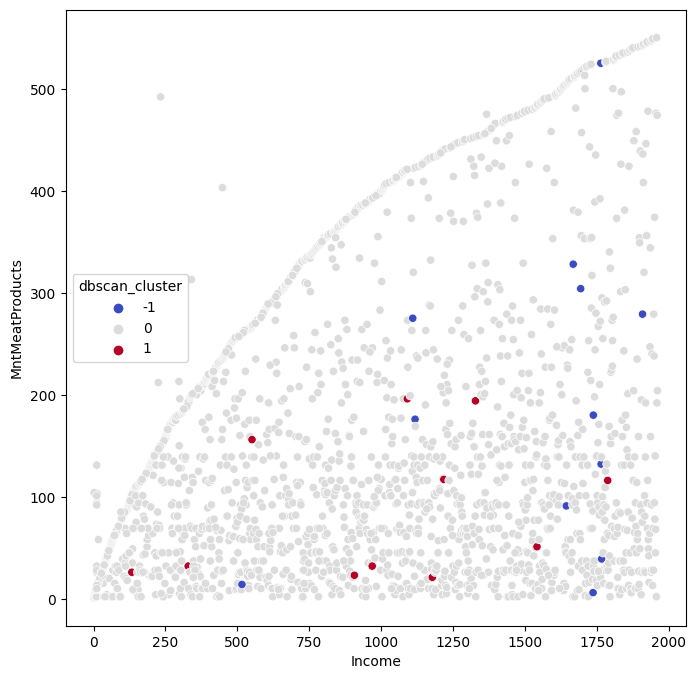

In [319]:
fig = plt.figure(figsize=(8,8))
sns.scatterplot(data = df_customer,x='Income',y='MntMeatProducts',hue='dbscan_cluster',palette='coolwarm')
plt.show()